In [1]:
import pandas as pd
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from IPython.display import Markdown, display
import nltk
from wordcloud import WordCloud

def preprocess_data(data):

    # 제목과 줄거리를 하나의 '제목_줄거리' 열로 결합합니다.
    data['title_overview'] = data['title'] + ' ' + data['overview']

    # '제목_줄거리' 열을 소문자로 변환하여 텍스트 처리를 개선합니다.
    data['title_overview'] = data['title_overview'].str.lower()

    # 분석에 필요하지 않은 열을 제거합니다.
    data.drop(['Unnamed: 0', 'id', 'status', 'original_language', 'original_title', 'spoken_languages', 'overview'],
              axis=1, inplace=True)

    # 상영 시간이 300분 미만인 영화를 필터링합니다.
    data = data[data.runtime < 300].reset_index(drop=True)

    # '개봉일' 열에서 연도를 '연도' 열로 추출합니다.
    data['year'] = data['release_date'].str[:4]

    # '개봉일' 열에서 월을 '월' 열로 추출합니다.
    data['month'] = data['release_date'].str[5:7]

    # 연도와 월이 추출되었으므로 원래의 '개봉일' 열을 제거합니다.
    data.drop(['release_date'], axis=1, inplace=True)

    # 현재 분석에 필요하지 않은 미래 연도(2024년 이후)를 데이터셋에서 제거합니다.
    years_to_remove = [2024, 2025, 2026, 2027, 2099]
    data = data[~data['year'].astype(int).isin(years_to_remove)].reset_index(drop=True)

    # 영화별로 쉼표로 구분된 장르를 목록으로 분리합니다.
    data['genres'] = data['genres'].str.split(',').apply(lambda x: [genre.strip() for genre in x])

    # 영화별로 쉼표로 구분된 제작 국가를 목록으로 분리합니다.
    data['production_countries'] = data['production_countries'].str.split(',').apply(lambda x: [country.strip() for country in x])

    # 가장 빈번한 상위 9개 제작 국가를 식별합니다.
    top_countries = [country for country, _ in Counter(data['production_countries'].sum()).most_common(9)]

    # 분석을 단순화하기 위해 다른 제작 국가를 '기타'로 대체합니다.
    data['production_countries'] = data['production_countries'].apply(lambda x: [country if country in top_countries else 'Other' for country in x])

    # 전처리된 데이터를 반환합니다.
    return data

In [2]:
def correlation_heatmap(data):
    # 데이터프레임에서 관련 열 추출
    heat = data[['vote_average', 'vote_count', 'revenue', 'runtime', 'budget', 'popularity']]

    # Seaborn으로 상관관계 열지도 생성
    corr_heatmap = sns.heatmap(heat.corr(), annot=True, fmt='.2f', cbar=False, cmap='cividis', linewidths=0.05)

    # X축 눈금 레이블 회전
    corr_heatmap.set_xticklabels(corr_heatmap.get_xticklabels(), rotation=30, horizontalalignment='center')

    # 열지도 제목 설정
    corr_heatmap.set_title('상관관계 열지도', fontsize=19)

    # 열지도 표시
    plt.show()


In [3]:
def movies_by_years(data):
    # 1. Figure와 Axis 생성
    # Figure는 전체 그래프 영역을, Axis는 그래프의 축과 눈금을 나타냅니다.
    fig, ax = plt.subplots(1, 1, figsize=(12, 6))

    # 2. 데이터 정렬
    # 'year' 컬럼의 영화 수를 카운트하고 감소하는 순서로 정렬합니다.
    sorted_data = data['year'].value_counts().sort_index(ascending=False)

    # 3. 산점도 그리기
    # Year를 x축으로, 영화 수를 y축으로 산점도를 그립니다.
    ax.plot(sorted_data.index[::-1], sorted_data.values[::-1], marker='o', linestyle='-', color='#000000')

    # 4. Y축 설정
    # Y축을 표시하고, 오른쪽 눈금과 레이블을 제거합니다.
    ax.get_yaxis().set_visible(True)
    ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False, labelright=True)

    # 5. 채우기
    # X축과 선 사이의 영역을 색상 그라데이션으로 채웁니다.
    ax.fill_between(sorted_data.index[::-1], 0, sorted_data.values[::-1], color='#b20710', alpha=1)

    # 6. 기준선 추가
    # Y축에 y=0의 기준선을 추가합니다.
    ax.axhline(y=0, color='black', linewidth=1.3, alpha=.7)

    # 7. X축 레이블 및 제목 설정
    # X축에 'YEAR' 레이블을 추가하고, 그래프에 'Number of Movies each year'라는 제목을 추가합니다.
    plt.xlabel('YEAR', fontsize=15)
    plt.title('Number of Movies each year', fontsize=20)

    # 8. 스파인 설정
    # 모든 스파인(축선)을 표시하고, 그리드를 제거합니다.
    for s in ['top', 'right', 'bottom', 'left']:
        ax.spines[s].set_visible(True)
    ax.grid(False)

    # 9. 그래프 표시
    # 그래프를 화면에 표시합니다.
    plt.show()


In [4]:
def movies_by_years_and_months(data):
    # 영화 데이터를 년도와 월별로 그룹화하고, 각 그룹의 영화 수를 카운트합니다.
    movies_by_month = data.groupby(['year', 'month']).size().reset_index(name='movie_count')

    # 년도와 월의 순서대로 정렬합니다.
    movies_by_month = movies_by_month.sort_values(['year', 'month'])

    # 년도의 수에 따라 맞춤형 색상 팔레트를 생성합니다.
    custom_palette = sns.color_palette("Set1", n_colors=len(movies_by_month['year'].unique()))

    # 새로운 그래프 창을 생성합니다.
    plt.figure(figsize=(12, 6))

    # Seaborn의 lineplot() 함수를 사용하여 월별 영화 수를 선 그래프로 그립니다.
    sns.lineplot(
        x='month',
        y='movie_count',
        hue='year',
        data=movies_by_month,
        marker='o',
        palette=custom_palette
    )

    # 그래프에 제목, x축 레이블, y축 레이블을 추가하고, 범례를 생성합니다.
    plt.title('Number of Movies Appeared by Month and Year', fontsize=20)
    plt.xlabel('Month', fontsize=15)
    plt.ylabel('Number of Movies', fontsize=13)
    plt.legend(title='Year', bbox_to_anchor=(1, 1))

    # 그래프를 화면에 표시합니다.
    plt.show()


In [5]:
def scatter_plot(data):
    # 투표 수와 수익, 예산과 수익, 인기와 예산, 상영 시간과 평균 투표 점수 사이의 산점도 그래프를 생성합니다.
    pairs = [('vote_count', 'revenue'), ('budget', 'revenue'), ('popularity', 'budget'), ('runtime', 'vote_average')]

    # 그래프의 배경색과 포인트 색상을 정의합니다.
    background_color = '#000000'
    point_color = '#b20710'

    # 각 쌍에 대해 산점도 그래프를 생성합니다.
    for pair in pairs:
        plt.figure(figsize=(8, 6))
        plt.scatter(data[pair[0]], data[pair[1]], alpha=0.9, c=point_color)

        # 그래프에 제목, x축 레이블, y축 레이블을 추가합니다.
        plt.title(f'{(pair[0]).upper()} & {(pair[1]).upper()}', fontsize=15)
        plt.xlabel(pair[0])
        plt.ylabel(pair[1])

        # 그래프의 축을 가져와 배경색을 설정합니다.
        ax = plt.gca()
        ax.set_facecolor(background_color)

        # 그래프를 화면에 표시합니다.
        plt.show()


In [6]:
def movies_by_genre(data):
    # 모든 영화의 장르 목록을 생성합니다.
    genres_list = []
    for i in range(len(data)):
        genres_list.extend(data.loc[i]['genres'])

    # 장르의 출현 빈도를 계산합니다.
    genre_counts = Counter(genres_list)
    genres = list(genre_counts.keys())
    counts = list(genre_counts.values())

    # 차트의 색상을 지정합니다.
    colors = ['#000000', '#b20710'] * ((len(genres) + 1) // 2)

    # 새로운 그래프 창을 생성하고, 파이 차트를 그립니다.
    plt.figure(figsize=(8, 8))
    plt.pie(
        counts,
        labels=genres,
        startangle=140,
        colors=colors,
        wedgeprops=dict(width=0.4, edgecolor='white')
    )

    # 파이 차트 중앙에 원을 추가합니다.
    hole = plt.Circle((0, 0), 0.6, facecolor='white')
    plt.gcf().gca().add_artist(hole)

    # 그래프에 제목을 추가합니다.
    plt.title('Distribution of Movies by Genre', fontsize=20)

    # 그래프를 화면에 표시합니다.
    plt.show()


In [7]:
def movies_by_countries(data):
    # 모든 영화의 제작 국가 목록을 생성합니다.
    countries_list = []
    for i in range(len(data)):
        countries_list.extend(data.loc[i]['production_countries'])

    # 제작 국가의 출현 빈도를 계산합니다.
    countries_counts = Counter(countries_list)
    countries = list(countries_counts.keys())
    counts = list(countries_counts.values())

    # 차트의 색상을 지정합니다.
    colors = ['#000000', '#b20710'] * ((len(countries) + 1) // 2)

    # 새로운 그래프 창을 생성하고, 파이 차트를 그립니다.
    plt.figure(figsize=(8, 8))
    plt.pie(
        counts,
        labels=countries,
        startangle=140,
        colors=colors,
        wedgeprops=dict(width=0.4, edgecolor='white')
    )

    # 파이 차트 중앙에 원을 추가합니다.
    hole = plt.Circle((0, 0), 0.6, facecolor='white')
    plt.gcf().gca().add_artist(hole)

    # 그래프에 제목을 추가합니다.
    plt.title('Distribution of Movies by Countries', fontsize=20)

    # 그래프를 화면에 표시합니다.
    plt.show()


In [8]:
def high_and_low_revenue(data):
    # 수익이 0 이상인 영화 데이터만 필터합니다.
    filtered_data = data[data['revenue'] > 0]

    # 수익이 가장 높은 1000개 영화와 가장 낮은 1000개 영화를 선택하고 인덱스를 다시 지정합니다.
    top_revenue = filtered_data.nlargest(1000, 'revenue').reset_index(drop=True)
    bot_revenue = filtered_data.nsmallest(1000, 'revenue').reset_index(drop=True)

    # 4행 2열의 그래프 창을 생성하고, 각 영화의 투표 평균, 상영 시간, 인기, 투표 수를 박스 플롯으로 그립니다.
    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 26))
    features = ['vote_average', 'runtime', 'popularity', 'vote_count']
    for i, feature in enumerate(features):
        sns.boxplot(x=feature, data=top_revenue, ax=axes[i, 0], linewidth=4, boxprops=dict(facecolor='#b20710'))
        axes[i, 0].set_title(f'Top 1000 Revenue Movies - {feature}', fontsize=15)
        axes[i, 0].set_xlabel(feature, fontsize=12)
        sns.boxplot(x=feature, data=bot_revenue, ax=axes[i, 1], linewidth=4, boxprops=dict(facecolor='#b20710'))
        axes[i, 1].set_title(f'Bottom 1000 Revenue Movies - {feature}', fontsize=15)
        axes[i, 1].set_xlabel(feature, fontsize=12)

    # 그래프 레이아웃을 조정합니다.
    plt.tight_layout()

    # 그래프를 화면에 표시합니다.
    plt.show()

    # 수익이 높은 영화의 장르 목록과 수익이 낮은 영화의 장르 목록을 생성합니다.
    genres_top = []
    genres_bot = []
    for i in range(len(top_revenue)):
        genres_top.extend(top_revenue.loc[i]['genres'])
    for i in range(len(bot_revenue)):
        genres_bot.extend(bot_revenue.loc[i]['genres'])

    # 각 장르의 출현 빈도를 계산하고, 출현 빈도가 높은 장르 순으로 정렬합니다.
    genres_top = [genre for genres_list in top_revenue['genres'] for genre in genres_list]
    genres_bot = [genre for genres_list in bot_revenue['genres'] for genre in genres_list]
    data2 = pd.DataFrame({'Genres': genres_top + genres_bot,
                          'Revenue': ['Top'] * len(genres_top) + ['Bottom'] * len(genres_bot)})

    # 수익이 높은 영화와 수익이 낮은 영화의 장르 분포를 비교하는 바 차트를 그립니다.
    colors = ['#000000', '#b20710']
    plt.figure(figsize=(14, 20))
    sns.countplot(y='Genres', hue='Revenue', data=data2,
                  order=pd.Series(genres_top + genres_bot).value_counts().index, palette=colors)
    plt.title('Comparison of Genres between Top and Bottom Revenue Movies', fontsize=23)
    plt.xlabel('Count', fontsize=15)
    plt.ylabel('', fontsize=15)
    plt.yticks(fontsize=12)
    plt.legend(title='Revenue', title_fontsize='25', fontsize='20', loc='upper right')
    plt.tight_layout()
    plt.show()

    # 수익이 높은 영화의 장르와 개요, 수익이 낮은 영화의 장르와 개요를 따로 저장합니다.
    genre_and_overview_top = top_revenue[['genres', 'title_overview']].copy()
    genre_and_overview_bot = bot_revenue[['genres', 'title_overview']].copy()


In [9]:
def word_cloud_gernes(data):
    # 영화 데이터에서 장르와 개요 정보를 추출합니다.
    genre_and_overview = data[['genres', 'title_overview']]

    # 추가로 제거할 스톱워드 목록을 정의합니다.
    additional_stopwords = ["find", "he", "take", "one", "two", "will", "became", "s", "S"]
    stop_words = set(stopwords.words('english') + additional_stopwords)

    # 데이터의 모든 장르에 대해 다음과 같은 작업을 반복합니다.
    for genre in data['genres'].explode().unique():
        # 해당 장르의 영화 데이터만 필터링합니다.
        genre_data = genre_and_overview[genre_and_overview['genres'].apply(lambda x: genre in x)]

        # 해당 장르의 영화 개요를 모두 하나의 문자열로 결합합니다.
        text_data = ' '.join(genre_data['title_overview'].astype(str))

        # 문자열을 토큰화하고, 스톱워드를 제거합니다.
        tokens = word_tokenize(text_data)
        filtered_tokens = [word.lower() for word in tokens if word.lower() not in stop_words]
        filtered_text = ' '.join(filtered_tokens)

        # 필터링된 텍스트를 기반으로 워드 클라우드를 생성합니다.
        wordcloud = WordCloud(width=800, height=400, background_color='black', colormap='Set2').generate(filtered_text)

        # 워드 클라우드를 그래프로 표시합니다.
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'{(genre).upper()}', fontsize=23)
        plt.axis('off')
        plt.show()


In [10]:
def word_cloud_years(data):
    # 영화 데이터에서 장르, 개요, 연도 정보를 추출하고, 연도 컬럼의 데이터 형식을 숫자형으로 변환합니다.
    genre_and_overview = data[['genres', 'title_overview', 'year']].copy()
    genre_and_overview.loc[:, 'year'] = pd.to_numeric(genre_and_overview['year'], errors='coerce')

    # 추가로 제거할 스톱워드 목록을 정의합니다.
    additional_stopwords = ["find", "he", "take", "one", "two", "will", "became", "s", "S", 'live', 'film']
    stop_words = set(stopwords.words('english') + additional_stopwords)

    # 각 영화 개요에 대해 스톱워드를 제거하고, 필터링된 텍스트를 생성합니다.
    genre_and_overview['filtered_text'] = genre_and_overview['title_overview'].apply(
        lambda x: ' '.join([word.lower() for word in word_tokenize(str(x)) if word.lower() not in stop_words])
    )

    # 영화 데이터를 연도별로 그룹화하고, 각 그룹의 필터링된 텍스트를 결합합니다.
    grouped_data = genre_and_overview.groupby('year').agg({'filtered_text': ' '.join}).reset_index()

    # 그룹화된 데이터의 각 행에 대해 워드 클라우드를 생성하고, 그래프로 표시합니다.
    for index, row in grouped_data.iterrows():
        year = row['year']
        filtered_texts = row['filtered_text']
        wordcloud = WordCloud(width=800, height=400, background_color='black', colormap='Set2').generate(filtered_texts)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Year {year}', fontsize=23)
        plt.axis('off')
        plt.show()


In [11]:
def load_data(file_path):
    data = pd.read_csv(file_path)
    return data

def print_message(message):
    display(Markdown(f"<h1 style='color:black;'>{message}</h1>"))

C:\Users\dobin\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\dobin\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 44288 (\N{HANGUL SYLLABLE GWAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\dobin\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 44228 (\N{HANGUL SYLLABLE GYE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\dobin\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 50676 (\N{HANGUL SYLLABLE YEOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\dobin\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\dobin\anaconda

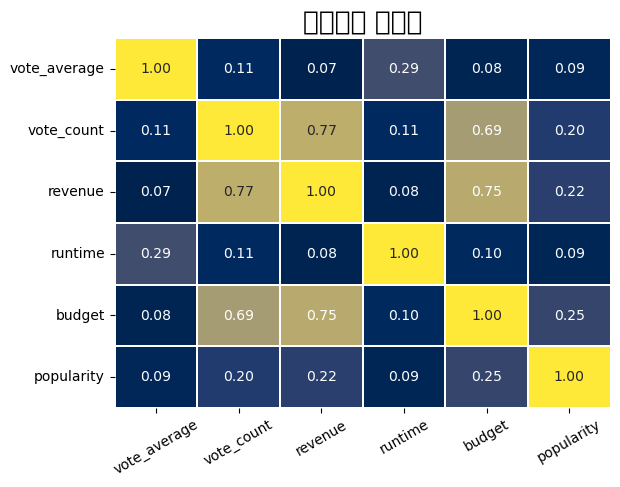

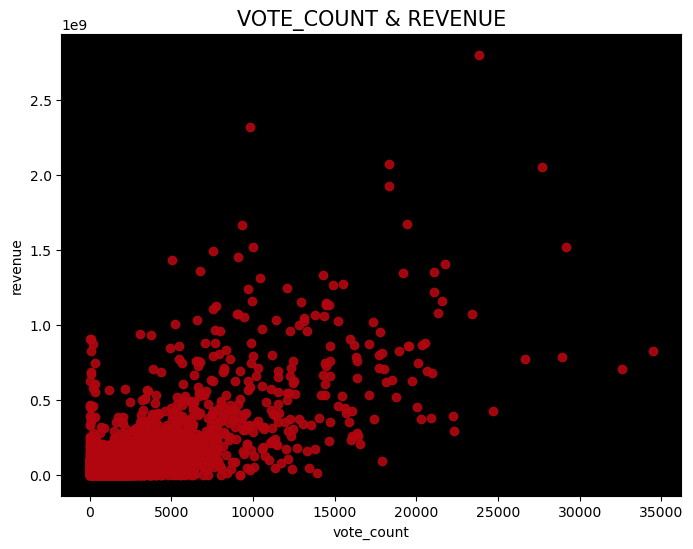

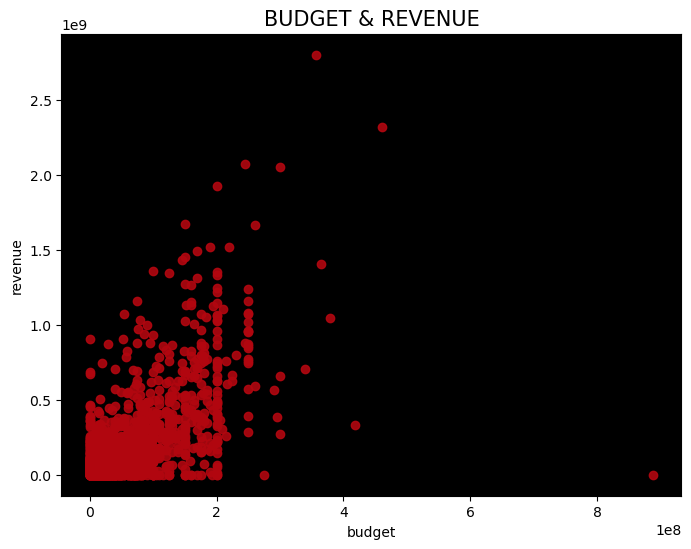

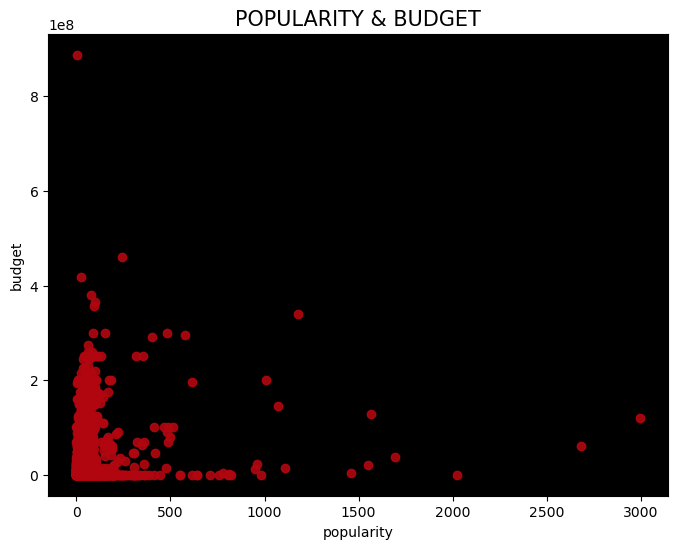

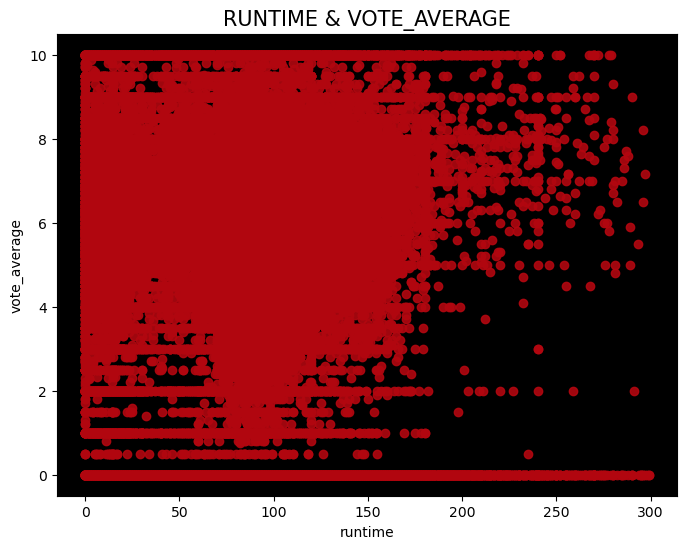

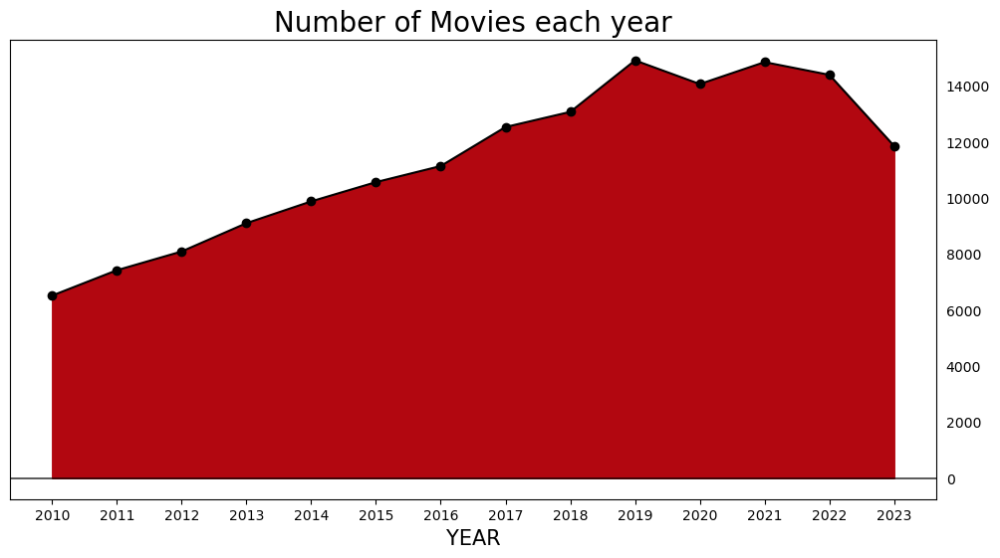

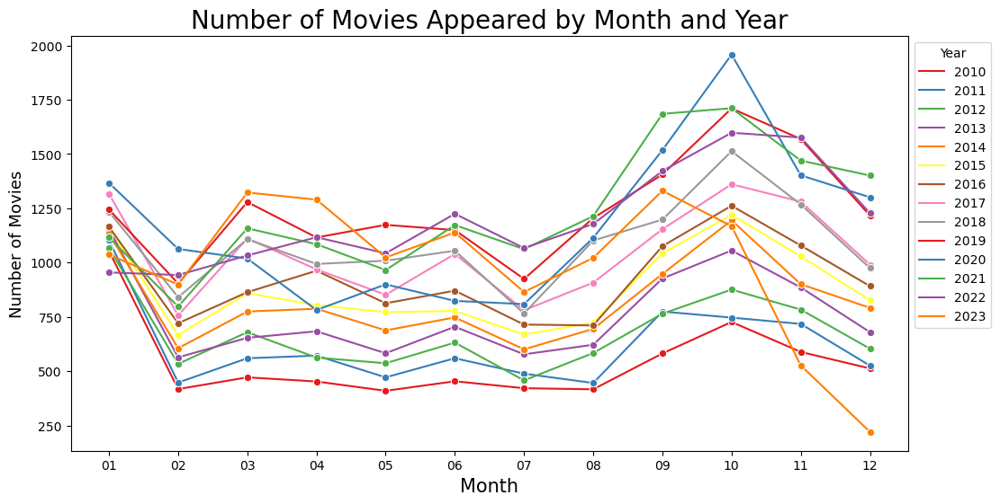

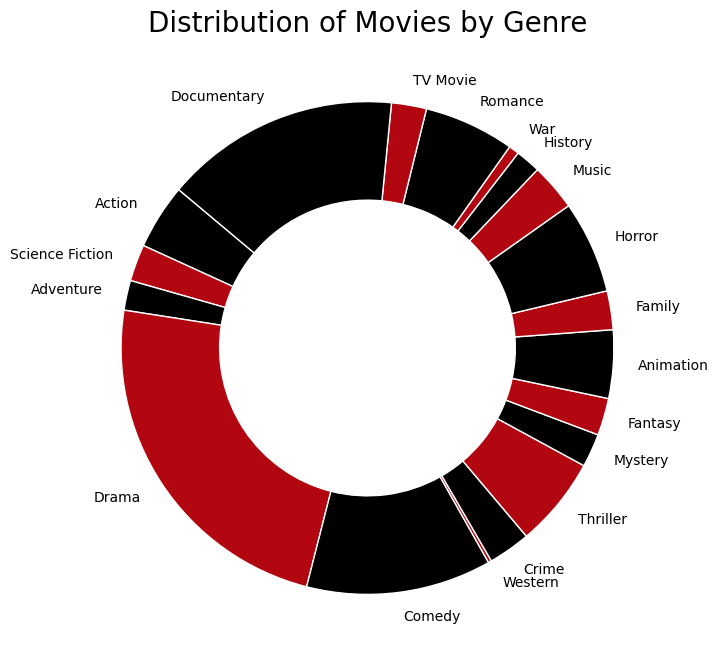

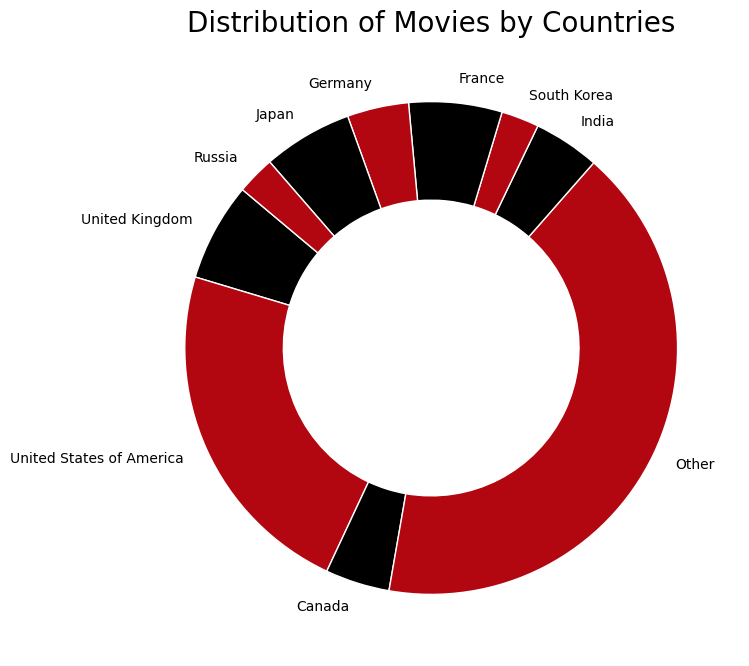

<h1 style='color:black;'>TOP highest revenue Movies VS TOP lowest revenue Movies</h1>

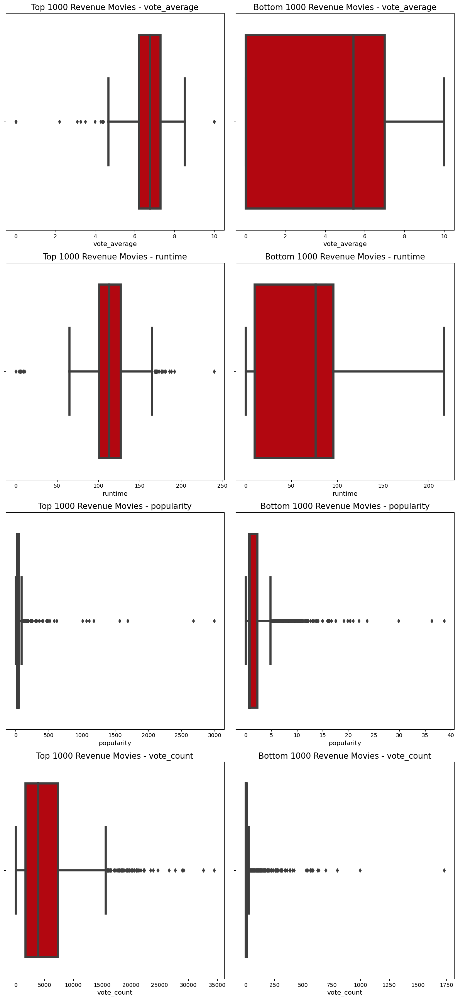

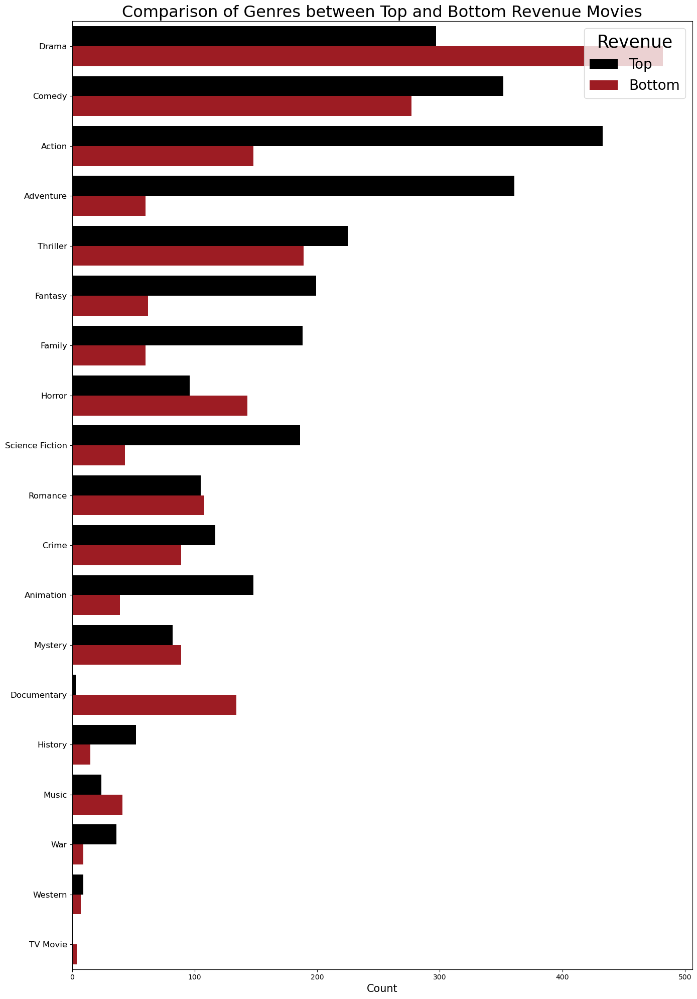

<h1 style='color:black;'>        WORDCLOUD by Genre</h1>

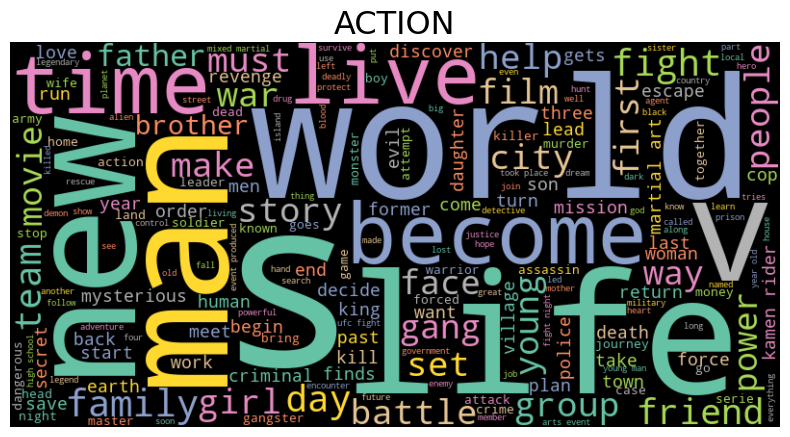

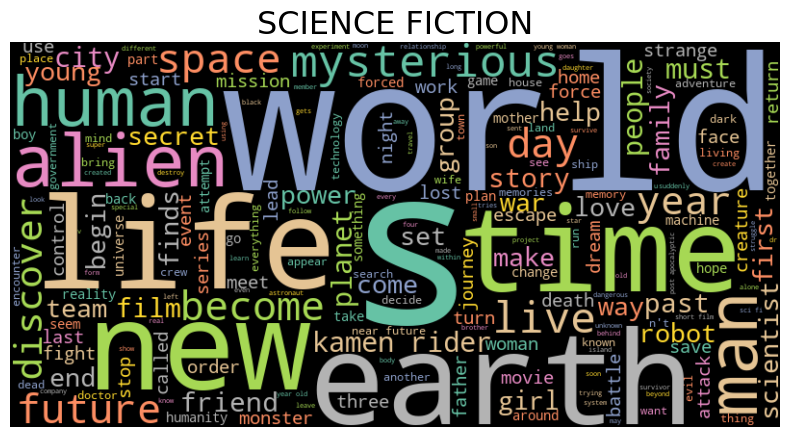

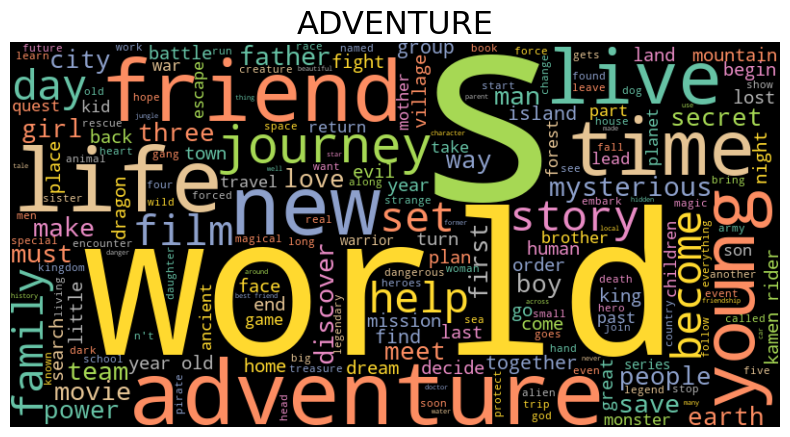

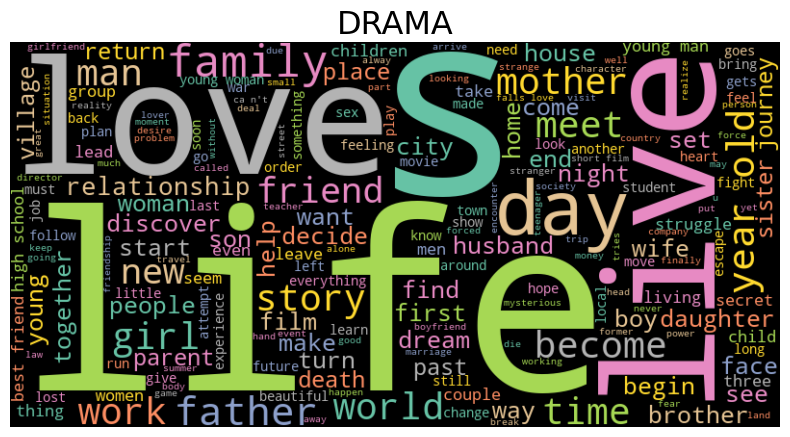

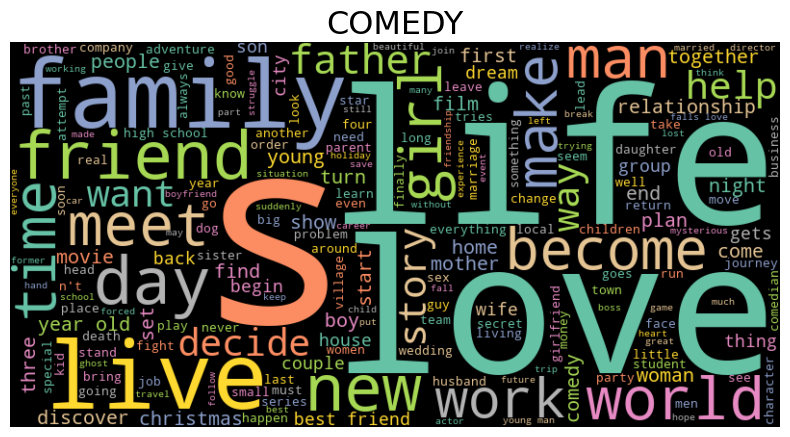

...

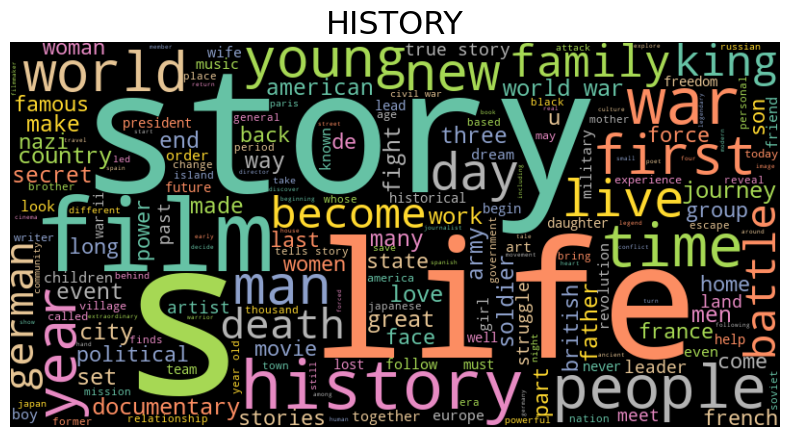

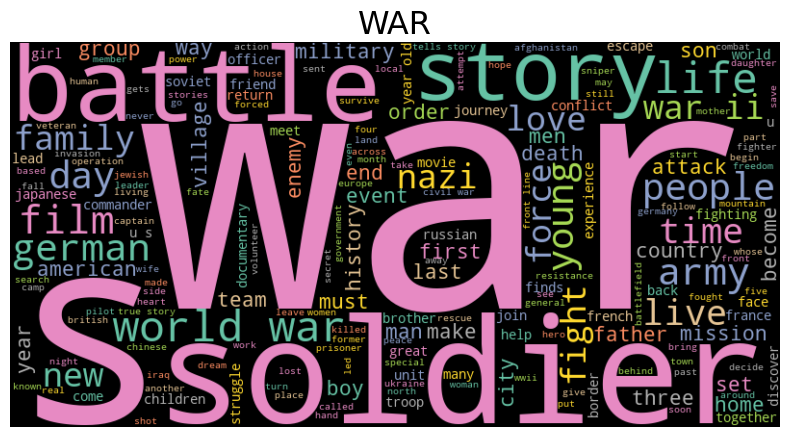

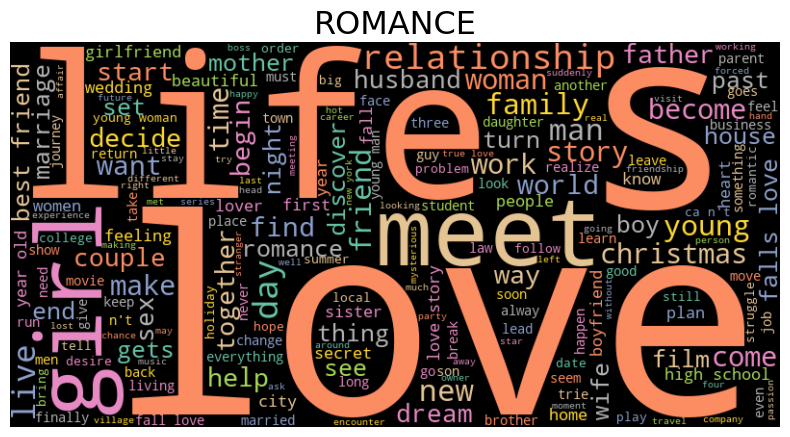

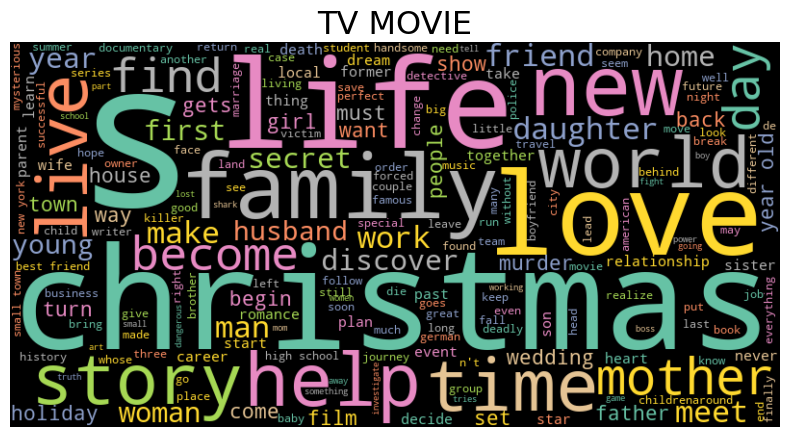

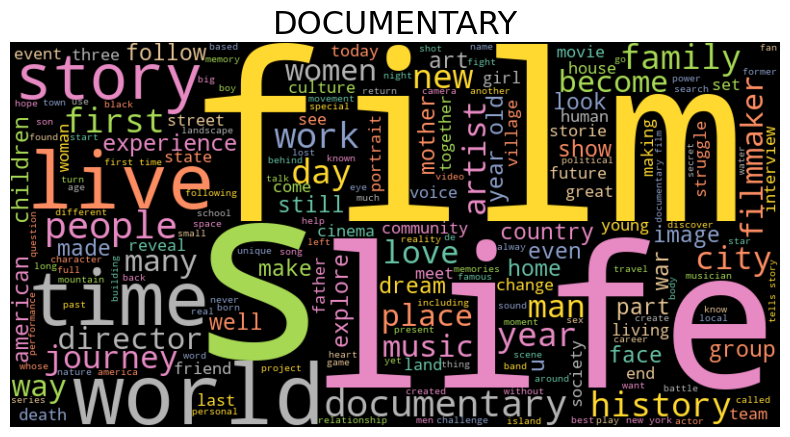

<h1 style='color:black;'>        WORDCLOUD by Year</h1>

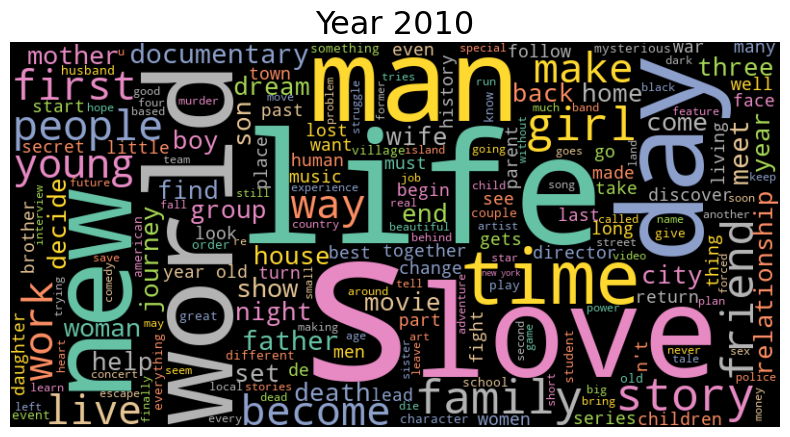

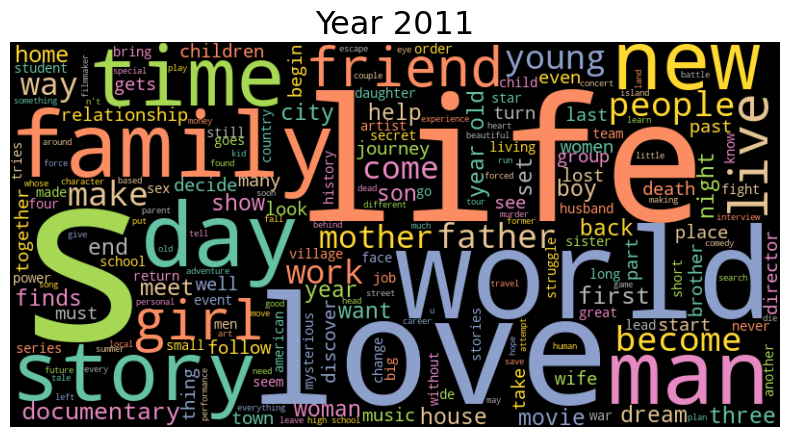

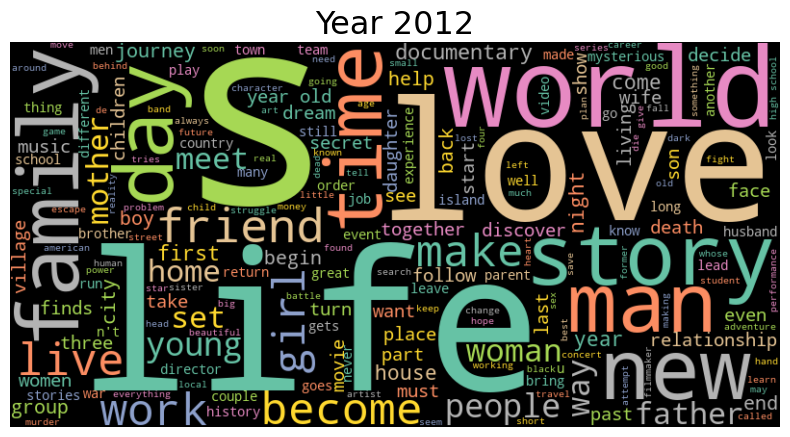

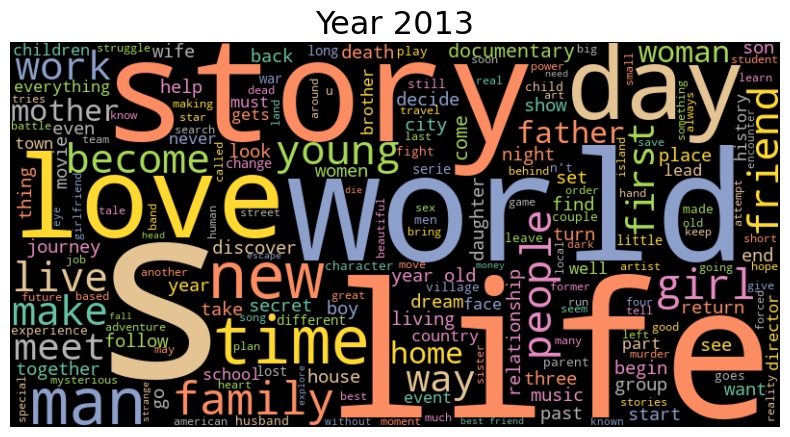

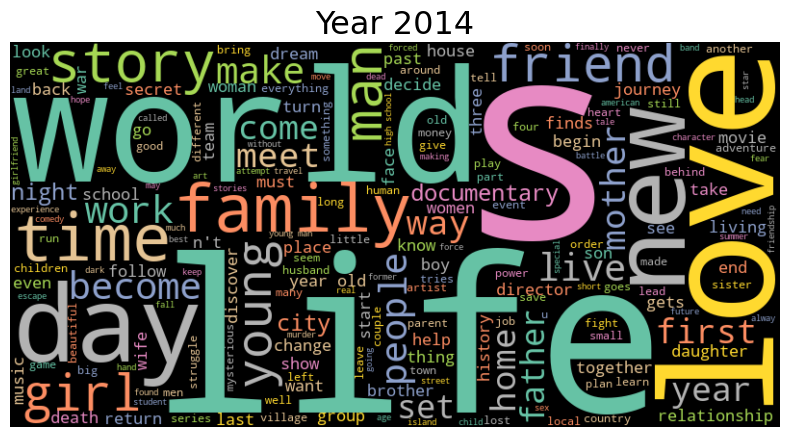

...

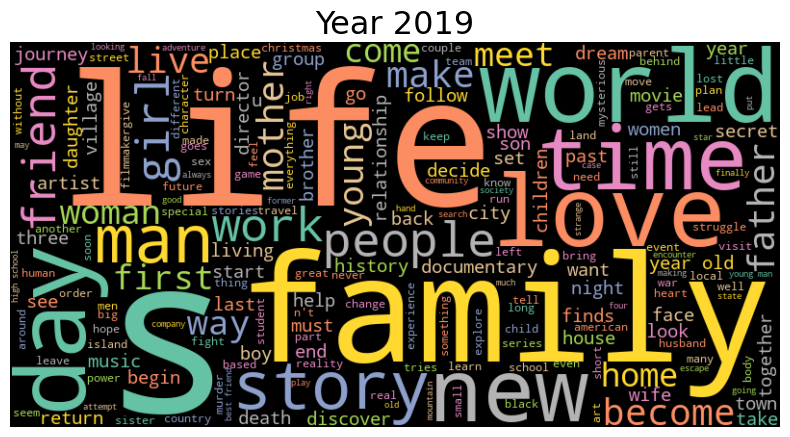

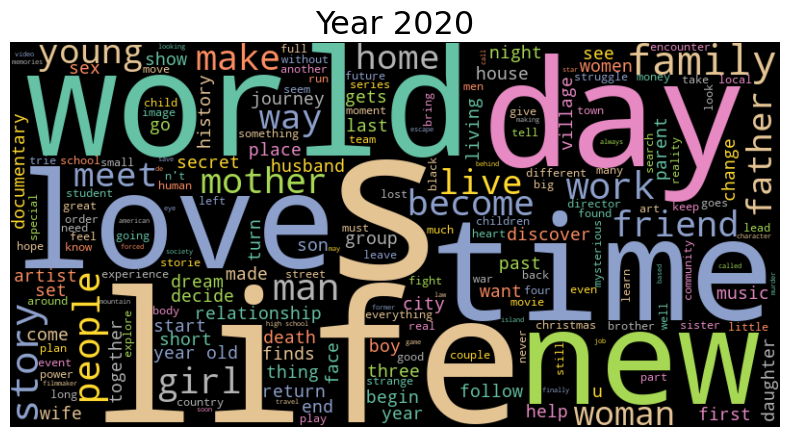

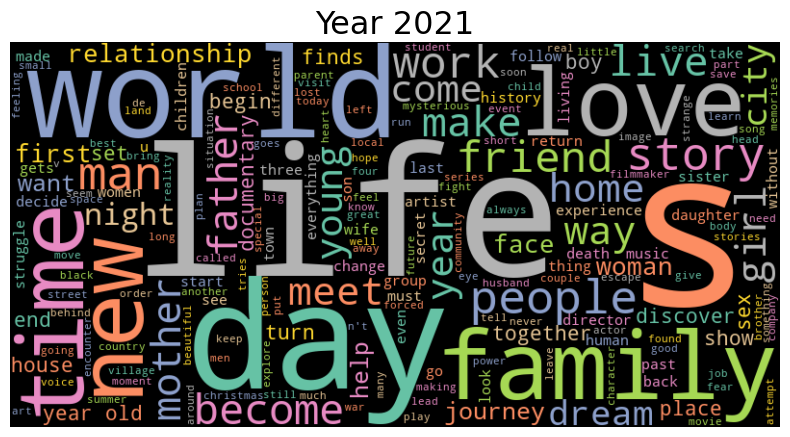

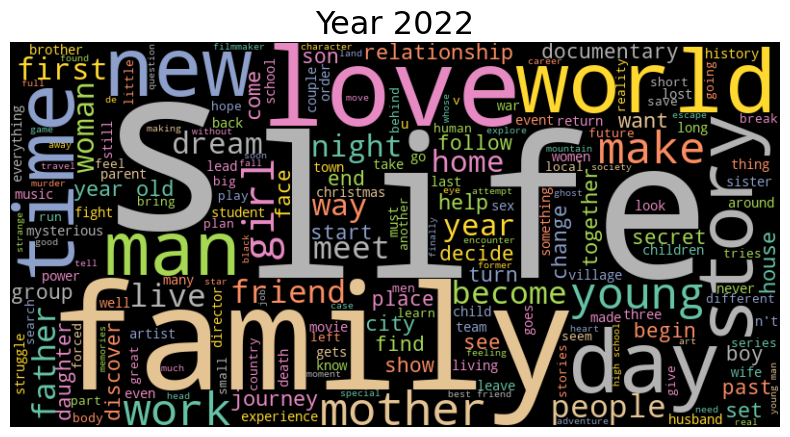

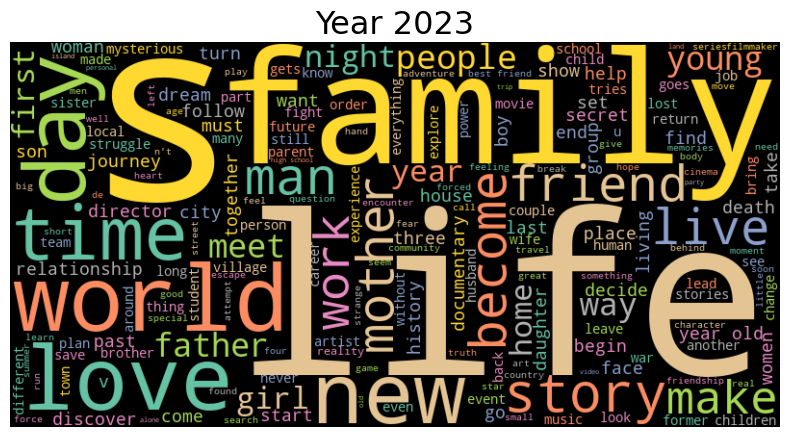

In [12]:
if __name__ == "__main__":
    # 데이터 파일의 경로를 지정합니다.
    file_path = 'data.csv'

    # 데이터를 로드합니다.
    data = load_data(file_path)

    # 데이터를 전처리합니다.
    data = preprocess_data(data)

    # 상관관계 히트맵을 그립니다.
    correlation_heatmap(data)

    # 산점도 그래프를 그립니다.
    scatter_plot(data)

    # 영화의 연도별 분포를 그립니다.
    movies_by_years(data)

    # 영화의 연도와 월별 분포를 그립니다.
    movies_by_years_and_months(data)

    # 영화의 장르별 분포를 그립니다.
    movies_by_genre(data)

    # 영화의 제작 국가별 분포를 그립니다.
    movies_by_countries(data)

    # 수익이 높은 영화와 수익이 낮은 영화의 비교를 출력합니다.
    print_message("TOP highest revenue Movies VS TOP lowest revenue Movies")
    high_and_low_revenue(data)

    # 장르별 워드 클라우드를 생성하고 출력합니다.
    print_message("        WORDCLOUD by Genre")
    word_cloud_gernes(data)

    # 연도별 워드 클라우드를 생성하고 출력합니다.
    print_message("        WORDCLOUD by Year")
    word_cloud_years(data)
